<a href="https://colab.research.google.com/github/Camilojaravila/202210_MINE-4206_ANALISIS_CON_MACHINE_LEARNING/blob/main/Taller%201/Laboratorio%202.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

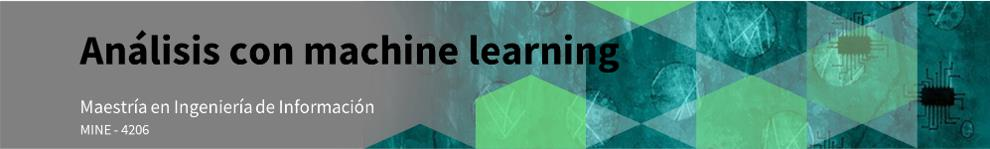

El gobierno de California ha realizado un censo inmobiliario para poder determinar cuáles son las características que hacen una propiedad tenga un mayor valor. Para esto obtuvo el valor de cada una de las características inmobiliarias y, para evitar tomar decisiones particulares por cada inmueble, se decidió agrupar la información por cuadras, y evitar sobreestimaciones o subestimaciones de algún inmueble en particular. El gobierno quiere obtener estas características para impulsar el mercado inmobiliaro en cada una de las regiones y así reactivar y controlar el sector. Para esto, le han contratado para realizar la consultoría de este caso.


Objetivos:
* Revisar los conceptos de una Regresión Lineal Regularizada.
* Evaluar los diferentes hiperparámetros para la construcción de un modelo.
* Crear Pipelines para búsquedas y automatizaciones de modelos.

## 0. Importación de Librerías.

Para el desarrollo en Google Colab, y poder ejecutar la librería de Pandas-Profiling, debemos ejecutar el siguiente código.


In [2]:
!pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip

     |████████████████████████████████| 25.9 MB 359 kB/s 
     |████████████████████████████████| 10.9 MB 4.2 MB/s 
     |████████████████████████████████| 596 kB 44.2 MB/s 
     |████████████████████████████████| 102 kB 8.0 MB/s 
     |████████████████████████████████| 675 kB 16.1 MB/s 
     |████████████████████████████████| 4.7 MB 35.8 MB/s 
     |████████████████████████████████| 63 kB 1.5 MB/s 
     |████████████████████████████████| 812 kB 35.9 MB/s 
     |████████████████████████████████| 38.1 MB 2.7 MB/s 
  Created wheel for pandas-profiling: filename=pandas_profiling-3.1.1-py2.py3-none-any.whl size=261287 sha256=3d3703a38fb3b6182e21292223fc99c17f57ca84057f1c70c9b476ba0d3e992a
  Stored in directory: /tmp/pip-ephem-wheel-cache-yfod4k4a/wheels/cc/d5/09/083fb07c9363a2f45854b0e3a7de7d7c560f07da74b9e9769d
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27098 sha256=1c4a457083aad6c125328c9b8521204e02ed9d07f864e397bd17768305b7f3b9
  Stored in directory: /roo

Para este ejercicio, utilizaremos las siguientes librerías.

In [3]:
#Manejo de datos
import pandas as pd
import numpy as np

#Visualización de datos
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

#Analisis profundo de datos
from pandas_profiling import ProfileReport

#Entrenamiento del modelo
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler, PolynomialFeatures 
from sklearn.linear_model import Lasso, Ridge
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.base import BaseEstimator,TransformerMixin
from sklearn.model_selection import GridSearchCV

#Librerías extras
import itertools


## 1. Entendimiento del Negocio

Luego de hablar con el equipo del censo, le preguntamos que significaba cada una de las variables que había logrado capturar en la encuesta. Dándonos los siguientes resultados:

1. Median House Value: Valor medio de la casa para esa cuadra.
2. Median Income: Valor medio de ingreso de los habitantes para esa cuadra.
3. Median Age: Edad Media de la casa para esa cuadra. (Entre menor el número, más nuevo).
4. Total Rooms: Número total de cuartos en esa cuadra.
5. Total Bedrooms: Número total de habitaciones en esa cuadra.
6. Population: Número total de habitantes en esa cuadra.
7. Households: Numero total de casas en esa cuadra.
8. Latitude: Latitud medida en grados.
9. Longitude: Longitud medida en grados.
10. Distance to coast: Distancia a la costa mas cercana [m].
11. Distance to Los Angeles: Distancia al centro de Los Angeles [m].
12. Distance to San Diego: Distancia al centro de San Diego [m]
13. Distance to San Jose: Distancia al centro de San Jose [m]
14. Distance to San Francisco: Distancia al centro de San Francisco [m]

## 2. Entendimiento de los Datos

Luego de entender el negocio y su objetivo, vamos a realizar la exploración de datos. Así que, leeremos los datos.

In [4]:
url = 'https://raw.githubusercontent.com/Camilojaravila/202210_MINE-4206_ANALISIS_CON_MACHINE_LEARNING/main/Taller%201/California_Houses.csv'

data = pd.read_csv(url)
data.head() #Veremos las primeras líneas del dataset, para ver si leyó correctamente

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
0,452600.0,8.3252,41,880,129,322,126,37.88,-122.23,9263.040773,556529.158342,735501.806984,67432.517001,21250.213767
1,358500.0,8.3014,21,7099,1106,2401,1138,37.86,-122.22,10225.733072,554279.850069,733236.884360,65049.908574,20880.600400
2,352100.0,7.2574,52,1467,190,496,177,37.85,-122.24,8259.085109,554610.717069,733525.682937,64867.289833,18811.487450
3,341300.0,5.6431,52,1274,235,558,219,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568
4,342200.0,3.8462,52,1627,280,565,259,37.85,-122.25,7768.086571,555194.266086,734095.290744,65287.138412,18031.047568


Primero necesitaremos dividir nuestros datos en datos de entrenamiento (train) y datos de evaluación (test). Para poder comparar los resultados con nuestra sesión anterior, utilizaremos la misma proporción de datos de entrenamiento, así como la misma semilla. 

In [5]:
train, test = train_test_split(data, test_size=0.2, random_state=33)
train.head()

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
3578,275300.0,2.9076,24,2718,719,3018,644,34.24,-118.53,23657.636674,33617.824551,211764.648663,458723.151688,526733.042849
11132,163900.0,4.2019,25,1026,288,1646,283,33.85,-117.93,19887.918652,36644.622486,144967.660334,527729.843217,595764.801847
14862,150000.0,2.6296,25,3509,985,2359,899,32.65,-117.09,4439.268497,189189.852033,9883.899190,680125.370743,748095.266383
4929,88200.0,1.6731,41,1425,372,1803,353,33.99,-118.24,20338.631866,6928.535718,173544.456158,497198.958683,565216.208568
7805,171500.0,3.6875,42,1150,215,708,204,33.89,-118.09,16855.925994,22940.742732,156527.899751,514650.681826,582676.057883


Utilizaremos la libreria de `pandas-profiling` para realizar una exploración de datos más profunda

In [6]:
ProfileReport(train)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

## 3. Preparación de los datos

Debido a que vamos a utilizar Regresión Regularizada, tendremos que hallar los **hiperparámetros** de modelo. Para poder determinar el rendimiento del modelo basado en los hiperparámetros, realizaremos una nueva tivisión de nuestros datos, entre entrenamiento, y validación.

In [7]:
train_m, val = train_test_split(train, test_size=0.2, random_state=33)
train_m.head()

,Median_House_Value,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
12255,120700.0,2.8393,20,1317,203,453,158,33.76,-117.02,66240.159265,117510.746424,116855.854178,593493.036500,661263.242454
3314,96900.0,1.8833,23,642,203,265,84,39.02,-122.79,66995.819793,685430.111899,864831.798657,203054.160548,142034.181804
4492,112500.0,10.2264,52,48,6,41,10,34.06,-118.22,26793.944491,2346.406430,178905.893288,492521.819891,560553.114495
1257,192400.0,3.4402,28,3144,694,1095,482,38.03,-121.65,3631.241318,537892.621756,717293.731327,80133.609937,74227.023837
11607,219500.0,5.3200,16,4021,701,1488,650,33.80,-118.01,10834.713808,35376.709763,144103.948816,527055.005014,595078.312711


In [8]:
X_train, y_train = train_m.drop(['Median_House_Value'],axis=1), train_m['Median_House_Value'] 
display(X_train)
y_train

,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
12255,2.8393,20,1317,203,453,158,33.76,-117.02,66240.159265,117510.746424,116855.854178,593493.036500,661263.242454
3314,1.8833,23,642,203,265,84,39.02,-122.79,66995.819793,685430.111899,864831.798657,203054.160548,142034.181804
4492,10.2264,52,48,6,41,10,34.06,-118.22,26793.944491,2346.406430,178905.893288,492521.819891,560553.114495
1257,3.4402,28,3144,694,1095,482,38.03,-121.65,3631.241318,537892.621756,717293.731327,80133.609937,74227.023837
11607,5.3200,16,4021,701,1488,650,33.80,-118.01,10834.713808,35376.709763,144103.948816,527055.005014,595078.312711
...,...,...,...,...,...,...,...,...,...,...,...,...,...
14150,2.6452,18,2968,656,1149,581,32.73,-117.07,10980.564052,182999.047373,8667.342112,674385.048580,742381.230296
5503,2.6667,45,1899,461,1260,415,33.99,-118.43,7655.810774,18513.331485,184297.542122,485985.863772,553940.783689
9383,5.4851,31,7001,1282,2755,1267,37.91,-122.50,4864.517024,574908.973481,753530.189002,83298.893366,16284.357069
16892,4.4000,52,2188,361,917,357,37.58,-122.37,6513.480884,540529.755481,718652.320329,50117.131278,22233.092538


12255    120700.0
3314      96900.0
4492     112500.0
1257     192400.0
11607    219500.0
           ...   
14150    154200.0
5503     320000.0
9383     441100.0
16892    500000.0
1083      69000.0
Name: Median_House_Value, Length: 13209, dtype: float64

## 4. Modelamiento

Seguiremos utilizando `scikit-learn` para entrenar nuestros modelos, en este caso utilizaremos Regresión  con penalización **L1** y **L2**.

In [9]:
LassoModel = Lasso(alpha=100)
LassoModel.fit(X_train, y_train)
print('Coefficients: ', LassoModel.coef_)
print('Intercept: ',LassoModel.intercept_)

Coefficients:  [ 3.93566250e+04  8.38034511e+02 -6.17653971e+00  1.02299094e+02
 -4.45353641e+01  6.17874807e+01 -4.25878915e+04 -2.81972085e+04
 -2.27219823e-01 -1.50305294e-01  2.22717500e-01  1.72310911e-01
 -1.48173369e-01]
Intercept:  -1871028.565323297


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.116e+13, tolerance: 1.754e+10
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


Para entender mejor los parámetros obtenidos, vamos a asociarlos a cada atributo.

In [10]:
coef = dict(zip(X_train.columns, LassoModel.coef_))
coef

{'Distance_to_LA': -0.15030529420540917,
 'Distance_to_SanDiego': 0.22271749968550697,
 'Distance_to_SanFrancisco': -0.14817336946972778,
 'Distance_to_SanJose': 0.17231091079871647,
 'Distance_to_coast': -0.22721982261695592,
 'Households': 61.787480708509975,
 'Latitude': -42587.89145548215,
 'Longitude': -28197.208533545672,
 'Median_Age': 838.0345105832164,
 'Median_Income': 39356.625027342154,
 'Population': -44.535364068445084,
 'Tot_Bedrooms': 102.29909433745846,
 'Tot_Rooms': -6.176539709326893}

## 5. Evaluación

Para mirar el rendimiento de nuestro modelo, vamos a utilizar nuestros datos de entrenamiento y validación.

In [11]:
y_pred = LassoModel.predict(X_train)
y_pred

array([119163.63481481, 121421.31311124, 492277.99504996, ...,
       346219.48587327, 283066.08096782,  35994.07603722])

Para determinar nuestro rendimiento, vamos a utilizar dos métricas, el $MSE$ y el $R^2$.

In [12]:
n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred))
print("R2-score: %.5f" % r2_score(y_train, y_pred) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con entrenamiento------------
Residual sum of squares (MSE): 4696200214.79
R2-score: 0.64624
Adj R2-score: 0.64589


Ahora utilizaremos los datos de validación para ver el rendimiento del modelo.

In [13]:
X_val, y_val = val.drop(['Median_House_Value'],axis=1), val['Median_House_Value'] 
y_pred2 = LassoModel.predict(X_val)
y_pred2

array([330548.08111301, 342099.91605862, 152522.69891393, ...,
       287596.44861517, 266976.91425063,  53377.26532704])

Para determinar nuestro rendimiento, vamos a utilizar dos métricas, el $MSE$ y el $R^2$.

In [14]:
n,p = X_val.shape

print('------------ Regresión Lasso con validación ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_val,y_pred2))
print("R2-score: %.5f" % r2_score(y_val, y_pred2) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_val, y_pred2))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con validación ------------
Residual sum of squares (MSE): 4692828100.67
R2-score: 0.64241
Adj R2-score: 0.64100


Y realizaremos una gráfica para ver como es el comportamiento de los datos reales vs los datos predecidos.

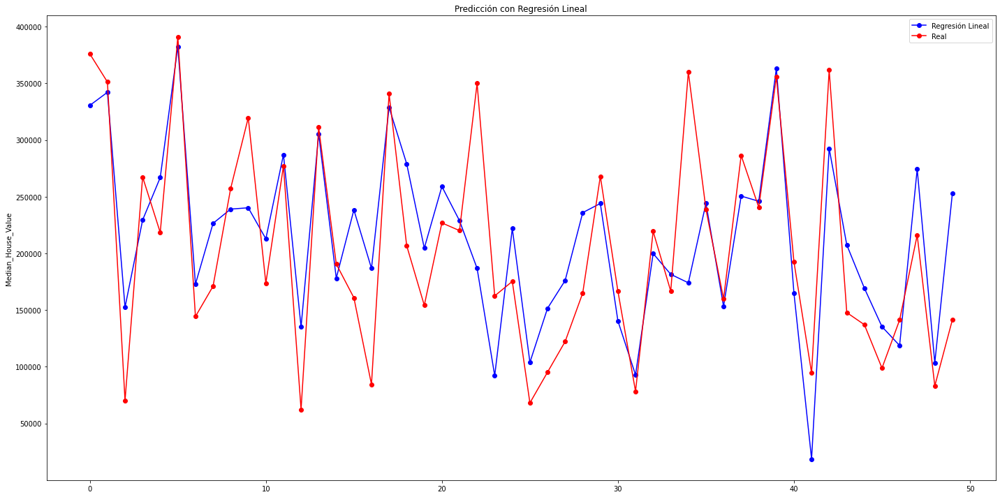

In [15]:
%matplotlib inline
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_val[:50])))
axs.plot(xvals, y_pred2[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_val[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

¿Ahora que pasa cambiamos el hiperparámetro de nuestro modelo?

In [16]:
LassoModel2 = Lasso(alpha=0.1)
LassoModel2.fit(X_train, y_train)
print('Intercept: ',LassoModel2.intercept_)
coef = dict(zip(X_train.columns, LassoModel2.coef_))
coef

Intercept:  -1868892.4790856412


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.101e+13, tolerance: 1.754e+10
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


{'Distance_to_LA': -0.15121608607941822,
 'Distance_to_SanDiego': 0.24170219084130173,
 'Distance_to_SanFrancisco': -0.15158215283245632,
 'Distance_to_SanJose': 0.17961239793865175,
 'Distance_to_coast': -0.208658379726966,
 'Households': 61.69102374289266,
 'Latitude': -45603.02306098542,
 'Longitude': -28999.238323860674,
 'Median_Age': 835.7260085956331,
 'Median_Income': 39397.85713772119,
 'Population': -44.49065802565711,
 'Tot_Bedrooms': 102.46494405667094,
 'Tot_Rooms': -6.210163452434326}

In [17]:
y_pred = LassoModel2.predict(X_train)
y_pred

array([118847.9371007 , 122464.83780099, 492413.53201821, ...,
       346858.2585355 , 283654.27303495,  36445.62917209])

In [18]:
n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred))
print("R2-score: %.5f" % r2_score(y_train, y_pred) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con entrenamiento------------
Residual sum of squares (MSE): 4695790779.81
R2-score: 0.64627
Adj R2-score: 0.64592


In [19]:
y_pred2 = LassoModel2.predict(X_val)
y_pred2

array([331941.67443675, 341913.97409597, 153152.86616515, ...,
       287597.03501482, 266800.16763921,  54029.71685491])

In [20]:
n,p = X_val.shape

print('------------ Regresión Lasso con validación ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_val,y_pred2))
print("R2-score: %.5f" % r2_score(y_val, y_pred2) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_val, y_pred2))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con validación ------------
Residual sum of squares (MSE): 4694195844.52
R2-score: 0.64231
Adj R2-score: 0.64090


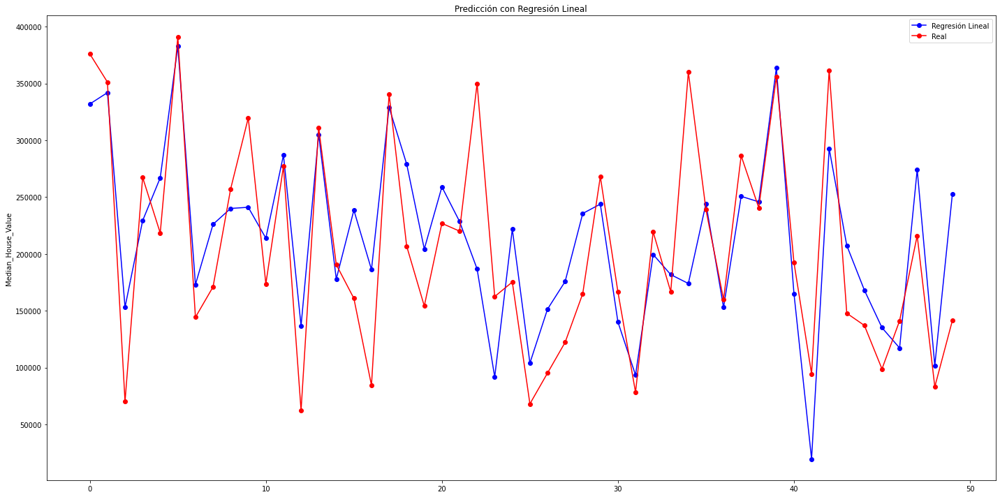

In [21]:
%matplotlib inline
fig, axs = plt.subplots(1,figsize=(20,10))

xvals = list(range(len(y_val[:50])))
axs.plot(xvals, y_pred2[:50],'bo-', label='Regresión Lineal')
axs.plot(xvals, y_val[:50],'ro-', label='Real')

axs.set(title='Predicción con Regresión Lineal',ylabel=y_train.name)
axs.legend()

plt.tight_layout()
plt.show()

## Pipelines

Como nos hemos dado cuenta, varios procesos se repiten a lo largo del ciclo del Aprendizaje de Datos. Donde por lo general solo se cambia algún paso adicional en la preparación de datos o algún parámetro en el Modelado del algoritmo. Al final, para determinar el mejor modelo, realizamos la comparación con nuestra métrica seleccionada.

Pero este proceso se puede **automatizar** con nuestros `Pipelines`, que permiten realizar ese flujo de datos y realizar alteraciones para poder medir e rendimiento de nuestro modelo.

In [22]:
estimators = [
        ('normalizar',StandardScaler())          
    ]

pipe = Pipeline(estimators)

pipe.fit_transform(X_train)

array([[-0.54245587, -0.69231944, -0.59454926, ..., -0.96743853,
         1.12306196,  1.09469813],
       [-1.05252243, -0.45456038, -0.89989726, ...,  1.62654714,
        -0.67994478, -0.9864958 ],
       [ 3.39887543,  1.84377719, -1.1686035 , ..., -0.75224857,
         0.65678722,  0.69102792],
       ...,
       [ 0.8691907 ,  0.17946378,  1.97670705, ...,  1.2405524 ,
        -1.23296234, -1.49053109],
       [ 0.29024381,  1.84377719, -0.20053725, ...,  1.11959571,
        -1.38619232, -1.46668714],
       [-1.5469562 ,  1.84377719, -0.53121783, ...,  1.69441533,
        -0.39302339, -0.66445172]])

Solo para que se vea más bonito.

In [23]:
pd.DataFrame(pipe.fit_transform(X_train), columns=X_train.columns)

,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
0,-0.542456,-0.692319,-0.594549,-0.791409,-0.866212,-0.890934,-0.871808,1.272525,0.522796,-0.605503,-0.967439,1.123062,1.094698
1,-1.052522,-0.454560,-0.899897,-0.791409,-1.033458,-1.084157,1.598347,-1.625327,0.538142,1.694321,1.626547,-0.679945,-0.986496
2,3.398875,1.843777,-1.168603,-1.256801,-1.232731,-1.277380,-0.730925,0.669852,-0.278264,-1.071868,-0.752249,0.656787,0.691028
3,-0.221850,-0.058295,0.231926,0.368527,-0.295082,-0.044932,1.133431,-1.052788,-0.748644,1.096859,1.114884,-1.247579,-1.258283
4,0.781103,-1.009332,0.628652,0.385064,0.054535,0.393736,-0.853024,0.775319,-0.602358,-0.938110,-0.872942,0.816258,0.829413
...,...,...,...,...,...,...,...,...,...,...,...,...,...
13204,-0.646016,-0.850825,0.152309,0.278756,-0.247043,0.213569,-1.355508,1.247413,-0.599396,-0.340304,-1.342637,1.496613,1.419838
13205,-0.634545,1.289006,-0.331271,-0.181911,-0.148296,-0.219877,-0.763798,0.564384,-0.666914,-1.006400,-0.733550,0.626605,0.664524
13206,0.869191,0.179464,1.976707,1.757615,1.181670,2.004797,1.077078,-1.479681,-0.723599,1.246759,1.240552,-1.232962,-1.490531
13207,0.290244,1.843777,-0.200537,-0.418150,-0.453433,-0.371322,0.922106,-1.414392,-0.690112,1.107538,1.119596,-1.386192,-1.466687


Y asi mismo ya con nuestro Pipeline entrenado, podemos utilizar otros datos directamente

In [24]:
pd.DataFrame(pipe.transform(X_val), columns=X_val.columns)

,Median_Income,Median_Age,Tot_Rooms,Tot_Bedrooms,Population,Households,Latitude,Longitude,Distance_to_coast,Distance_to_LA,Distance_to_SanDiego,Distance_to_SanJose,Distance_to_SanFrancisco
0,0.780249,0.971994,-0.186061,-0.403976,-0.444537,-0.376544,-0.552473,-0.078467,-0.731096,-0.508331,-0.317908,0.124445,0.223930
1,1.928913,-0.216801,1.106352,0.240958,0.396145,0.357181,1.081774,-1.238612,-0.506546,1.137710,1.149323,-1.313075,-1.397091
2,-0.694889,0.654982,-0.533027,-0.578793,-0.497913,-0.494044,2.424862,-2.323423,-0.796794,2.615820,2.415640,0.372118,-0.086541
3,0.723107,-0.771572,0.490680,0.059053,0.321418,0.229236,-1.294458,1.187146,-0.694062,-0.414368,-1.316280,1.412149,1.346532
4,0.017977,1.843777,-0.213656,-0.269320,-0.536166,-0.290377,1.062990,-1.374214,-0.736389,1.186469,1.189858,-1.294743,-1.487192
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3298,2.214678,1.843777,0.414230,-0.075603,-0.134063,-0.021432,0.992548,-1.459592,-0.695401,1.178235,1.180790,-1.310481,-1.533748
3299,-0.002564,-0.930078,-0.297796,-0.051979,-0.279959,0.004680,-0.838936,0.750208,-0.575864,-0.960034,-0.854411,0.790679,0.807199
3300,1.140764,-0.454560,0.364017,0.063778,0.268931,0.077791,-0.735621,0.725097,-0.139527,-1.031485,-0.774291,0.691713,0.721357
3301,0.463165,1.368259,-0.387817,-0.526821,-0.599329,-0.441822,-0.679268,0.730119,0.011733,-1.005995,-0.735700,0.649190,0.684391


Al utilizar estos Pipeline, no solo permite encapsular todos los pasos y llevar un mejor control, sino también permite incluir nuevos pasos y agregarlos automáticamente, esto incluyendo nuestro **Estimador** final.

In [25]:
estimators = [
        ('normalizar',StandardScaler()),
        ('regresion', Lasso())          
    ]

pipe = Pipeline(estimators)

pipe.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.035e+13, tolerance: 1.754e+10
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


Pipeline(steps=[('normalizar', StandardScaler()), ('regresion', Lasso())])

In [26]:
y_pred_train = pipe.predict(X_train)
y_pred_val = pipe.predict(X_val)
y_pred_train

array([118851.30907997, 122417.61047451, 492398.54070608, ...,
       346779.24971877, 283624.72162598,  36442.63587097])

In [27]:
n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

n,p = X_val.shape

print('------------ Regresión Lasso con validación ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_val,y_pred_val))
print("R2-score: %.5f" % r2_score(y_val, y_pred_val) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_val, y_pred_val))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con entrenamiento------------
Residual sum of squares (MSE): 4695795890.21
R2-score: 0.64627
Adj R2-score: 0.64592
------------ Regresión Lasso con validación ------------
Residual sum of squares (MSE): 4694204800.11
R2-score: 0.64231
Adj R2-score: 0.64090


Nos hemos dado cuenta que en la Regresión Lasso nos ha funcionado mejor con respecto a la Regresión Lineal. Pero ¿Qué pasaría si lo utilizamos con una regresión Polinomial?

In [28]:
class ToPolynomial(BaseEstimator,TransformerMixin):
    def __init__(self,k=2):
        self.k = k

    def fit(self,X,y=None):
        return self
    
    def transform(self,X,y=None):
        columns = X.columns
        X_train_pol = pd.concat([X**(i+1) for i in range(self.k)],axis=1) #Polinomios sin interacciones
        X_train_pol.columns = np.reshape([[i+' '+str(j+1) for i in columns] for j in range(self.k)],-1)
        temp = pd.concat([X[i[0]]*X[i[1]] for i in list(itertools.combinations(columns, 2))],axis=1) #Combinaciones sólo de grado 1
        temp.columns = [' '.join(i) for i in list(itertools.combinations(columns, 2))]
        X_train_pol = pd.concat([X_train_pol,temp],axis=1)
        return X_train_pol

In [29]:
estimators = [
        ('polinomial',ToPolynomial()),
        ('regresion', Lasso())          
    ]

pipe_pol = Pipeline(estimators)

pipe_pol.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.500e+13, tolerance: 1.754e+10
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


Pipeline(steps=[('polinomial', ToPolynomial()), ('regresion', Lasso())])

Y, ¿Como hago para acceder a los parámetros que entrenó la Regresión Polinomial?

In [30]:
reg_lineal = pipe_pol['regresion']

print('Intercept: ',reg_lineal.intercept_)
print('Coefficients: ',reg_lineal.coef_)

Intercept:  -4153115.290686317
Coefficients:  [ 5.81672738e+04  2.33476020e+03  3.14827871e+00  1.06681353e+02
 -3.12181089e+01  1.18433954e+01  2.41231782e+03 -2.36331730e+04
  1.21476344e-01 -7.81150100e-02  5.06780680e-02  9.59625252e-03
 -3.84676947e-02 -1.72737850e+03  2.15499125e+01  3.10685921e-04
 -4.22331299e-02  8.13320632e-03 -2.00759076e-02 -3.52008193e+02
  1.02779116e+02  1.37796817e-06  1.27190689e-07 -6.72837143e-08
  4.89450561e-07 -4.69934837e-08  2.35895386e+02  6.12451908e+00
 -1.13151584e+01 -6.69759807e+00 -9.10924238e-01 -5.19085710e+01
 -8.35556394e+01 -1.60748365e-01  7.92685096e-03 -2.30771889e-02
 -2.82546017e-02  3.30235291e-03 -3.93052031e-01  3.94440667e+00
 -1.22718191e+00  2.38069934e+00 -1.28784595e+02 -2.26846803e+01
 -4.54662479e-03  1.58355962e-03 -3.80424300e-03  6.76039277e-03
 -9.47841614e-03 -1.07053753e-04 -6.39883738e-03  2.07657619e-02
 -6.67735651e-01  1.64683798e-02  1.17263767e-04  2.42574800e-05
 -2.07363924e-05 -2.35345344e-06 -1.06336434

In [31]:
y_pred_train = pipe_pol.predict(X_train)
y_pred_val = pipe_pol.predict(X_val)
y_pred_train

array([114212.30896153, 120330.76016673, 450436.25112854, ...,
       367987.30769307, 302996.37403748,  66942.87893875])

In [32]:
n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

n,p = X_val.shape

print('------------ Regresión Lasso con validación ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_val,y_pred_val))
print("R2-score: %.5f" % r2_score(y_val, y_pred_val) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_val, y_pred_val))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con entrenamiento------------
Residual sum of squares (MSE): 3784914372.11
R2-score: 0.71489
Adj R2-score: 0.71460
------------ Regresión Lasso con validación ------------
Residual sum of squares (MSE): 3838501397.11
R2-score: 0.70751
Adj R2-score: 0.70636


Y si lo hacemos de grado 3...

In [33]:
estimators = [
        ('polinomial',ToPolynomial(k=3)),
        ('regresion', Lasso())          
    ]

pipe_pol = Pipeline(estimators)

pipe_pol.fit(X_train, y_train)

/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 2.383e+13, tolerance: 1.754e+10
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


Pipeline(steps=[('polinomial', ToPolynomial(k=3)), ('regresion', Lasso())])

In [34]:
reg_lineal = pipe_pol['regresion']

print('Intercept: ',reg_lineal.intercept_)
print('Coefficients: ',reg_lineal.coef_)

Intercept:  -2785704.128219999
Coefficients:  [ 4.31187086e+04  2.66012297e+03  1.28328594e+01  4.47888910e+01
 -5.38966892e+01  7.79394864e+01  6.92406389e+03 -1.51778499e+04
 -1.08477633e-01 -7.54991067e-02  6.18457670e-02 -1.29871361e-02
 -3.32776377e-02  6.18412465e+03 -7.58127280e+01 -2.66030117e-04
 -4.84224337e-02  1.66250120e-02 -8.04739321e-02 -1.74128784e+02
  5.16889777e+01  2.45535671e-06  2.13754776e-07 -6.95242047e-08
  5.20481020e-07 -4.93938458e-08 -3.70511510e+02  1.08529996e+00
 -9.65826082e-09  4.95628516e-06 -2.75981383e-07  4.62875941e-06
  1.37757422e-01 -4.98239759e-01 -3.37851210e-12  1.04964676e-13
 -8.41948708e-14 -1.80507097e-13 -4.26125321e-14  3.13054261e+02
  3.72946956e+00  3.10996445e+00 -8.01662090e+00  1.03364071e+00
 -1.24872816e+03 -5.19831628e+01 -1.27364450e-01  4.80616213e-03
  6.55565437e-04 -1.12470760e-02  1.90317308e-03 -5.75920536e-01
  4.54909845e+00 -9.05481807e-01  1.73238246e+00 -7.68433225e+01
 -2.22057197e+01 -4.47293160e-03  1.26643542

In [35]:
y_pred_train = pipe_pol.predict(X_train)
y_pred_val = pipe_pol.predict(X_val)
y_pred_train

array([117226.14010638, 119887.31765277, 511296.9718923 , ...,
       360800.20515183, 297592.08115789,  83165.03531471])

In [36]:
n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

n,p = X_val.shape

print('------------ Regresión Lasso con validación ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_val,y_pred_val))
print("R2-score: %.5f" % r2_score(y_val, y_pred_val) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_val, y_pred_val))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con entrenamiento------------
Residual sum of squares (MSE): 3608025675.68
R2-score: 0.72821
Adj R2-score: 0.72794
------------ Regresión Lasso con validación ------------
Residual sum of squares (MSE): 3614736686.71
R2-score: 0.72456
Adj R2-score: 0.72347


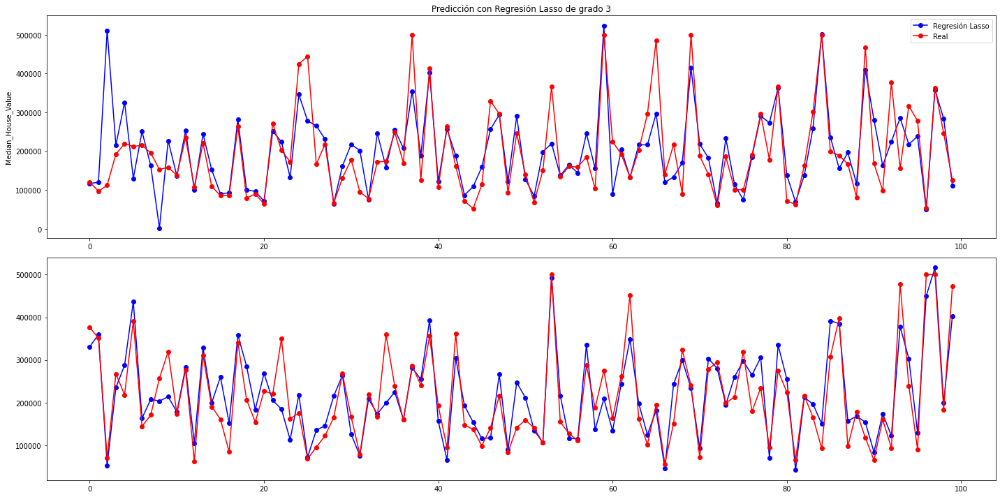

In [37]:
%matplotlib inline
fig, axs = plt.subplots(2,figsize=(20,10))
n= 100

xvals = list(range(len(y_val[:n])))
axs[0].plot(xvals, y_pred_train[:n],'bo-', label='Regresión Lasso')
axs[0].plot(xvals, y_train[:n],'ro-', label='Real')

axs[1].plot(xvals, y_pred_val[:n],'bo-', label='Regresión Lasso')
axs[1].plot(xvals, y_val[:n],'ro-', label='Real')

axs[0].set(title='Predicción con Regresión Lasso de grado 3',ylabel=y_train.name)
axs[0].legend()

plt.tight_layout()
plt.show()

## Validación Cruzada

Ahora si, ¿Que pasa si pongo todo junto? ¿Que pasa si defino un espacio de búsqueda para mis hiperparámetros? ¿Y si utilizo validación cruzada para encontrar los hiperparámetros de mi modelo?

In [38]:
estimators = [
        ('polinomial',ToPolynomial()),
        ('normalizar',StandardScaler()),
        ('regresion', Lasso())          
    ]

pipe = Pipeline(estimators)

parameters = {
              'polinomial__k':[2,3,4,5],
              'regresion__alpha': [0.001, 0.01, 0.1, 1, 10, 100],
              'normalizar': [StandardScaler(), 'passthrough']
              }

grid_search = GridSearchCV(pipe, parameters, verbose=2, scoring='neg_mean_squared_error', cv=5, n_jobs=-1)


In [39]:
%%time
X_train, y_train = train.drop(['Median_House_Value'],axis=1), train['Median_House_Value'] 

grid_search.fit(X_train,y_train)

Fitting 5 folds for each of 48 candidates, totalling 240 fits
CPU times: user 10.2 s, sys: 1.25 s, total: 11.5 s
Wall time: 7min 29s


/usr/local/lib/python3.7/dist-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.154e+12, tolerance: 2.187e+10
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


In [40]:
best_model = grid_search.best_estimator_

pd.DataFrame(grid_search.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_normalizar,param_polinomial__k,param_regresion__alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
0,3.174201,0.137980,0.057627,0.003934,StandardScaler(),2,0.001,"{'normalizar': StandardScaler(), 'polinomial__...",-3.820884e+09,-3.860159e+09,-3.890795e+09,-5.255316e+09,-3.866669e+09,-4.138765e+09,5.587275e+08,6
1,3.176844,0.093452,0.064015,0.003771,StandardScaler(),2,0.01,"{'normalizar': StandardScaler(), 'polinomial__...",-3.820888e+09,-3.860160e+09,-3.890794e+09,-5.255234e+09,-3.866681e+09,-4.138751e+09,5.586930e+08,5
2,3.113064,0.082665,0.064646,0.004836,StandardScaler(),2,0.1,"{'normalizar': StandardScaler(), 'polinomial__...",-3.820925e+09,-3.860172e+09,-3.890782e+09,-5.254413e+09,-3.866803e+09,-4.138619e+09,5.583486e+08,4
3,3.286114,0.314065,0.063941,0.005716,StandardScaler(),2,1,"{'normalizar': StandardScaler(), 'polinomial__...",-3.821345e+09,-3.860336e+09,-3.890684e+09,-5.246491e+09,-3.868059e+09,-4.137383e+09,5.550049e+08,3
4,2.882615,0.045231,0.089576,0.045672,StandardScaler(),2,10,"{'normalizar': StandardScaler(), 'polinomial__...",-3.828153e+09,-3.859426e+09,-3.893415e+09,-5.196027e+09,-3.873836e+09,-4.130171e+09,5.333530e+08,2
5,2.529242,0.251918,0.066907,0.005769,StandardScaler(),2,100,"{'normalizar': StandardScaler(), 'polinomial__...",-3.910907e+09,-3.938390e+09,-3.961672e+09,-5.077757e+09,-4.003350e+09,-4.178415e+09,4.506913e+08,13
6,3.436780,0.058756,0.061883,0.000797,StandardScaler(),3,0.001,"{'normalizar': StandardScaler(), 'polinomial__...",-3.636459e+09,-3.687544e+09,-3.651022e+09,-1.249738e+10,-3.698871e+09,-5.434256e+09,3.531638e+09,33
7,3.434948,0.068071,0.061701,0.005586,StandardScaler(),3,0.01,"{'normalizar': StandardScaler(), 'polinomial__...",-3.636460e+09,-3.687550e+09,-3.651034e+09,-1.249627e+10,-3.698873e+09,-5.434037e+09,3.531189e+09,31
8,3.479150,0.046427,0.069626,0.006043,StandardScaler(),3,0.1,"{'normalizar': StandardScaler(), 'polinomial__...",-3.636472e+09,-3.687615e+09,-3.651153e+09,-1.248510e+10,-3.698892e+09,-5.431846e+09,3.526701e+09,29
9,3.467122,0.025822,0.067896,0.007464,StandardScaler(),3,1,"{'normalizar': StandardScaler(), 'polinomial__...",-3.636621e+09,-3.688377e+09,-3.652363e+09,-1.237415e+10,-3.699055e+09,-5.410114e+09,3.482095e+09,27


In [41]:
grid_search.best_params_

{'normalizar': StandardScaler(), 'polinomial__k': 3, 'regresion__alpha': 100}

In [42]:
X_test, y_test = test.drop(['Median_House_Value'],axis=1), test['Median_House_Value'] 

y_pred_train = best_model.predict(X_train)
y_pred_test = best_model.predict(X_test)
y_pred_train

array([139004.84281692, 168735.89658344, 170931.34406692, ...,
       261544.73554898, 221232.49243907,  99201.35646171])

In [43]:
n,p = X_train.shape

print('------------ Regresión Lasso con entrenamiento------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_train,y_pred_train))
print("R2-score: %.5f" % r2_score(y_train, y_pred_train) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_train, y_pred_train))*(n-1)/(n-p-1)) )

n,p = X_test.shape

print('------------ Regresión Lasso con evaluación ------------')
print("Residual sum of squares (MSE): %.2f" % mean_squared_error(y_test,y_pred_test))
print("R2-score: %.5f" % r2_score(y_test, y_pred_test) )
print("Adj R2-score: %.5f" % ( 1-(1-r2_score(y_test, y_pred_test))*(n-1)/(n-p-1)) )

------------ Regresión Lasso con entrenamiento------------
Residual sum of squares (MSE): 3716813271.57
R2-score: 0.71938
Adj R2-score: 0.71916
------------ Regresión Lasso con evaluación ------------
Residual sum of squares (MSE): 3593852129.73
R2-score: 0.73568
Adj R2-score: 0.73485


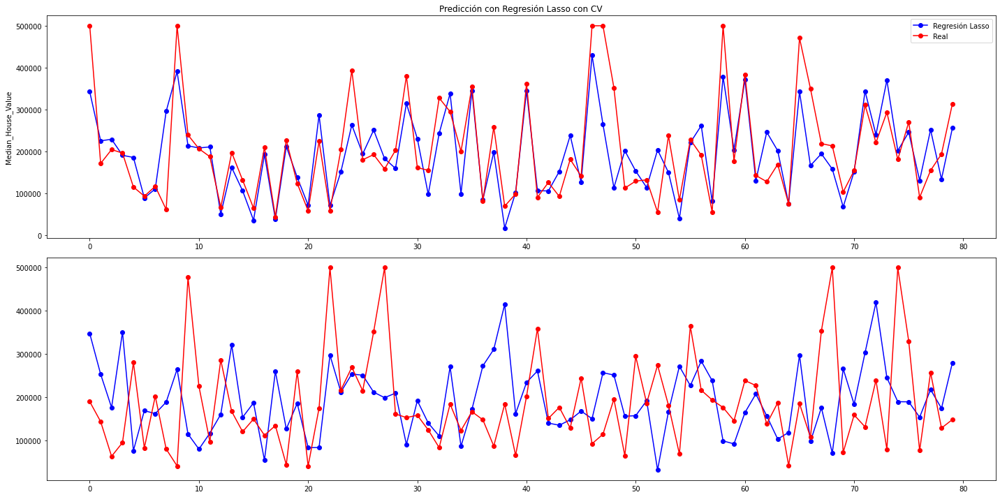

In [44]:
%matplotlib inline
fig, axs = plt.subplots(2,figsize=(20,10))
a = 1000
b= 1080

xvals = list(range(b-a))
axs[0].plot(xvals, y_pred_train[a:b],'bo-', label='Regresión Lasso')
axs[0].plot(xvals, y_train[a:b],'ro-', label='Real')

axs[1].plot(xvals, y_pred_val[a:b],'bo-', label='Regresión Lasso')
axs[1].plot(xvals, y_test[a:b],'ro-', label='Real')

axs[0].set(title='Predicción con Regresión Lasso con CV',ylabel=y_train.name)
axs[0].legend()

plt.tight_layout()
plt.show()

Ya con nuestro mejor modelo encontrado y teniendo un rendimiento esperado en producción, podremos determinar la importancia de las variables del modelo gracias a la Regresión Lasso. Para ello se obtuvo el siguiente resultado.

In [56]:
lasso_model = best_model['regresion']
fake_df = best_model['polinomial'].transform(X_test)
print(f'Intercepto: {lasso_model.intercept_}')
coef = list(zip(['Intercepto'] + list(fake_df.columns), [lasso_model.intercept_] + list(lasso_model.coef_)))
coef = pd.DataFrame(coef,columns=['Variable','Parámetro'])
coef

Intercepto: 206619.8795421512


,Variable,Parámetro
0,Intercepto,206619.879542
1,Median_Income 1,6270.387490
2,Median_Age 1,-0.000000
3,Tot_Rooms 1,-0.000000
4,Tot_Bedrooms 1,12591.061450
...,...,...
113,Distance_to_LA Distance_to_SanJose,-16314.085460
114,Distance_to_LA Distance_to_SanFrancisco,-13114.293630
115,Distance_to_SanDiego Distance_to_SanJose,0.000000
116,Distance_to_SanDiego Distance_to_SanFrancisco,14208.301035


In [58]:
coef.sort_values('Parámetro')

,Variable,Parámetro
27,Median_Income 3,-86349.947692
73,Tot_Bedrooms Population,-37206.041980
43,Median_Income Population,-36753.104873
34,Longitude 3,-34499.071973
7,Latitude 1,-34119.912407
...,...,...
42,Median_Income Tot_Bedrooms,28623.092928
53,Median_Age Tot_Bedrooms,45823.840491
18,Population 2,106972.635974
14,Median_Income 2,127827.485789


In [61]:
coef[coef['Parámetro'].between(-1,1)]

,Variable,Parámetro
2,Median_Age 1,-0.0
3,Tot_Rooms 1,-0.0
6,Households 1,0.0
10,Distance_to_LA 1,-0.0
11,Distance_to_SanDiego 1,0.0
12,Distance_to_SanJose 1,-0.0
13,Distance_to_SanFrancisco 1,-0.0
15,Median_Age 2,-0.0
16,Tot_Rooms 2,0.0
19,Households 2,-0.0


Y finalmente, para poder salvar nuestro modelo.

In [62]:
from joblib import dump, load

dump(best_model,'lasso_regressor.pkl')

['lasso_regressor.pkl']

In [63]:
model = load('lasso_regressor.pkl') 
model

Pipeline(steps=[('polinomial', ToPolynomial(k=3)),
                ('normalizar', StandardScaler()),
                ('regresion', Lasso(alpha=100))])